<a href="https://colab.research.google.com/github/llekomtsev/AI_Lab3/blob/main/AI_Lab3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install -q torch torchvision transformers faiss-cpu gradio pillow tqdm matplotlib pandas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.8/23.8 MB 26.5 MB/s eta 0:00:00


In [2]:
import os
import json
import zipfile
import random
import numpy as np
import pandas as pd
from tqdm import tqdm
from PIL import Image

import torch
import faiss
import gradio as gr
import matplotlib.pyplot as plt

from transformers import CLIPProcessor, CLIPModel

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)

Device: cpu


In [3]:
PROJECT_DIR = "/content/AI_Lab3_CLIP_Image_Search"
DATA_DIR = os.path.join(PROJECT_DIR, "data")
IMAGE_DIR = os.path.join(DATA_DIR, "val2014")
INDEX_DIR = os.path.join(PROJECT_DIR, "index")

os.makedirs(PROJECT_DIR, exist_ok=True)
os.makedirs(DATA_DIR, exist_ok=True)
os.makedirs(INDEX_DIR, exist_ok=True)

print("Project dir:", PROJECT_DIR)
print("Data dir:", DATA_DIR)
print("Image dir:", IMAGE_DIR)
print("Index dir:", INDEX_DIR)

Project dir: /content/AI_Lab3_CLIP_Image_Search
Data dir: /content/AI_Lab3_CLIP_Image_Search/data
Image dir: /content/AI_Lab3_CLIP_Image_Search/data/val2014
Index dir: /content/AI_Lab3_CLIP_Image_Search/index


In [4]:
zip_path = os.path.join(DATA_DIR, "val2014.zip")

if not os.path.exists(zip_path):
    !wget -O /content/AI_Lab3_CLIP_Image_Search/data/val2014.zip http://images.cocodataset.org/zips/val2014.zip
else:
    print("Archive already exists:", zip_path)

--2026-05-20 13:00:11--  http://images.cocodataset.org/zips/val2014.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 16.15.229.198, 16.15.191.156, 16.15.207.42, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|16.15.229.198|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 6645013297 (6.2G) [application/zip]
Saving to: ‘/content/AI_Lab3_CLIP_Image_Search/data/val2014.zip’

/content/AI_Lab3_CL 100%[===================>]   6.19G  40.3MB/s    in 2m 50s  

2026-05-20 13:03:01 (37.3 MB/s) - ‘/content/AI_Lab3_CLIP_Image_Search/data/val2014.zip’ saved [6645013297/6645013297]



In [5]:
if not os.path.exists(IMAGE_DIR):
    with zipfile.ZipFile(zip_path, "r") as zip_ref:
        zip_ref.extractall(DATA_DIR)
    print("Extracted to:", DATA_DIR)
else:
    print("Already extracted:", IMAGE_DIR)

Extracted to: /content/AI_Lab3_CLIP_Image_Search/data


In [6]:
image_paths = []

for file in os.listdir(IMAGE_DIR):
    if file.lower().endswith((".jpg", ".jpeg", ".png")):
        image_paths.append(os.path.join(IMAGE_DIR, file))

image_paths = sorted(image_paths)

print("Total images:", len(image_paths))

if len(image_paths) == 0:
    raise RuntimeError("No images found. Check IMAGE_DIR path.")

print("Example:", image_paths[0])

Total images: 40504
Example: /content/AI_Lab3_CLIP_Image_Search/data/val2014/COCO_val2014_000000000042.jpg


In [7]:
NUM_IMAGES = 20000

random.seed(42)
selected_image_paths = random.sample(image_paths, min(NUM_IMAGES, len(image_paths)))

print("Selected images:", len(selected_image_paths))

Selected images: 20000


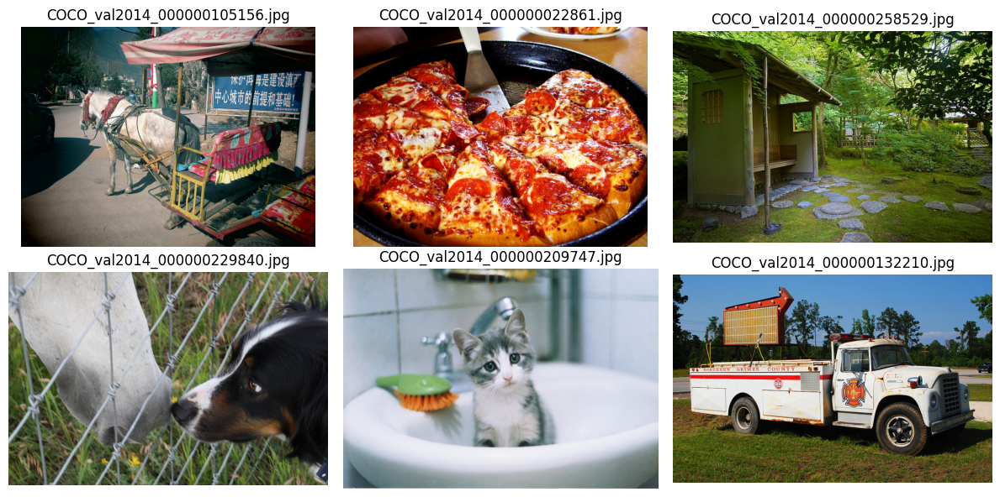

In [8]:
plt.figure(figsize=(12, 6))

for i, path in enumerate(selected_image_paths[:6]):
    img = Image.open(path).convert("RGB")
    plt.subplot(2, 3, i + 1)
    plt.imshow(img)
    plt.axis("off")
    plt.title(os.path.basename(path))

plt.tight_layout()
plt.show()

In [9]:
clip_model_name = "openai/clip-vit-base-patch32"

clip_model = CLIPModel.from_pretrained(clip_model_name).to(DEVICE)
clip_processor = CLIPProcessor.from_pretrained(clip_model_name)

clip_model.eval()

print("CLIP loaded:", clip_model_name)

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:93: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/605M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
vision_model.embeddings.position_ids | UNEXPECTED |  | 
text_model.embeddings.position_ids   | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

The image processor of type `CLIPImageProcessor` is now loaded as a fast processor by default, even if the model checkpoint was saved with a slow processor. This is a breaking change and may produce slightly different outputs. To continue using the slow processor, instantiate this class with `use_fast=False`. 


tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

CLIP loaded: openai/clip-vit-base-patch32


In [10]:
@torch.no_grad()
def get_image_embeddings(image_paths, batch_size=32):
    all_embeddings = []
    valid_paths = []

    for i in tqdm(range(0, len(image_paths), batch_size)):
        batch_paths = image_paths[i:i + batch_size]

        images = []
        current_valid_paths = []

        for path in batch_paths:
            try:
                image = Image.open(path).convert("RGB")
                images.append(image)
                current_valid_paths.append(path)
            except Exception as e:
                print("Error loading image:", path, e)

        if len(images) == 0:
            continue

        inputs = clip_processor(
            images=images,
            return_tensors="pt"
        ).to(DEVICE)

        outputs = clip_model.get_image_features(**inputs)

        if hasattr(outputs, "pooler_output"):
            image_features = outputs.pooler_output
        else:
            image_features = outputs

        image_features = image_features / image_features.norm(dim=-1, keepdim=True)

        all_embeddings.append(image_features.cpu().numpy())
        valid_paths.extend(current_valid_paths)

    embeddings = np.vstack(all_embeddings).astype("float32")

    return embeddings, valid_paths

In [11]:
image_embeddings, valid_image_paths = get_image_embeddings(
    selected_image_paths,
    batch_size=32
)

print("Image embeddings shape:", image_embeddings.shape)
print("Valid image paths:", len(valid_image_paths))


100%|██████████| 625/625 [53:35<00:00,  5.15s/it]

Image embeddings shape: (20000, 512)
Valid image paths: 20000


In [12]:
embedding_dim = image_embeddings.shape[1]

index = faiss.IndexFlatIP(embedding_dim)
index.add(image_embeddings)

print("FAISS index size:", index.ntotal)

FAISS index size: 20000


In [13]:
faiss_index_path = os.path.join(INDEX_DIR, "clip_coco_faiss.index")
metadata_path = os.path.join(INDEX_DIR, "image_paths.json")

faiss.write_index(index, faiss_index_path)

with open(metadata_path, "w", encoding="utf-8") as f:
    json.dump(valid_image_paths, f, ensure_ascii=False, indent=2)

print("Saved FAISS index:", faiss_index_path)
print("Saved metadata:", metadata_path)

Saved FAISS index: /content/AI_Lab3_CLIP_Image_Search/index/clip_coco_faiss.index
Saved metadata: /content/AI_Lab3_CLIP_Image_Search/index/image_paths.json


In [14]:
@torch.no_grad()
def get_text_embedding(query):
    inputs = clip_processor(
        text=[query],
        return_tensors="pt",
        padding=True,
        truncation=True,
        max_length=77
    ).to(DEVICE)

    outputs = clip_model.get_text_features(**inputs)

    if hasattr(outputs, "pooler_output"):
        text_features = outputs.pooler_output
    else:
        text_features = outputs

    text_features = text_features / text_features.norm(dim=-1, keepdim=True)

    return text_features.cpu().numpy().astype("float32")

In [15]:
def search_images(query, top_k=5):
    query_embedding = get_text_embedding(query)

    scores, indices = index.search(query_embedding, top_k)

    results = []

    for score, idx in zip(scores[0], indices[0]):
        image_path = valid_image_paths[idx]
        results.append((image_path, float(score)))

    return results

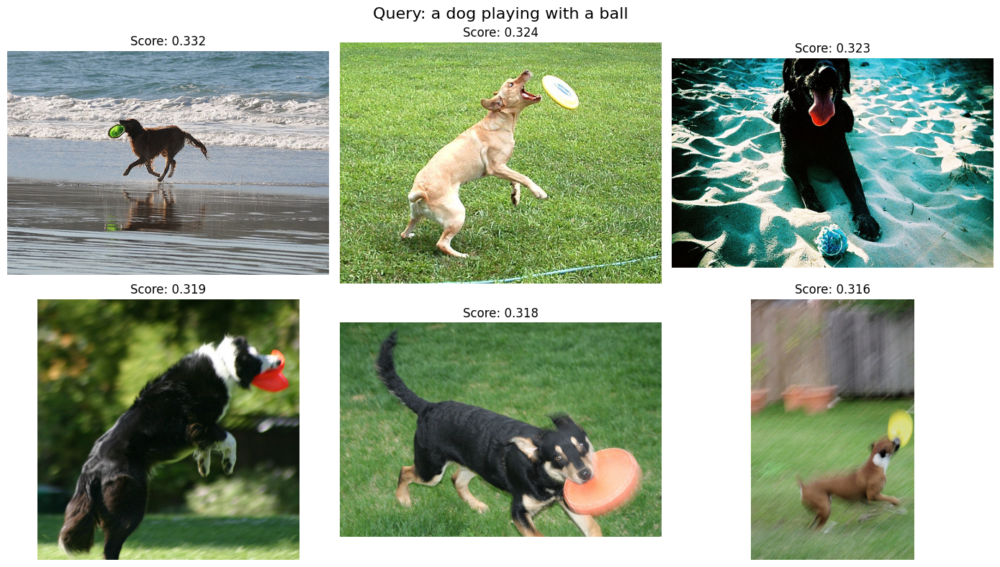

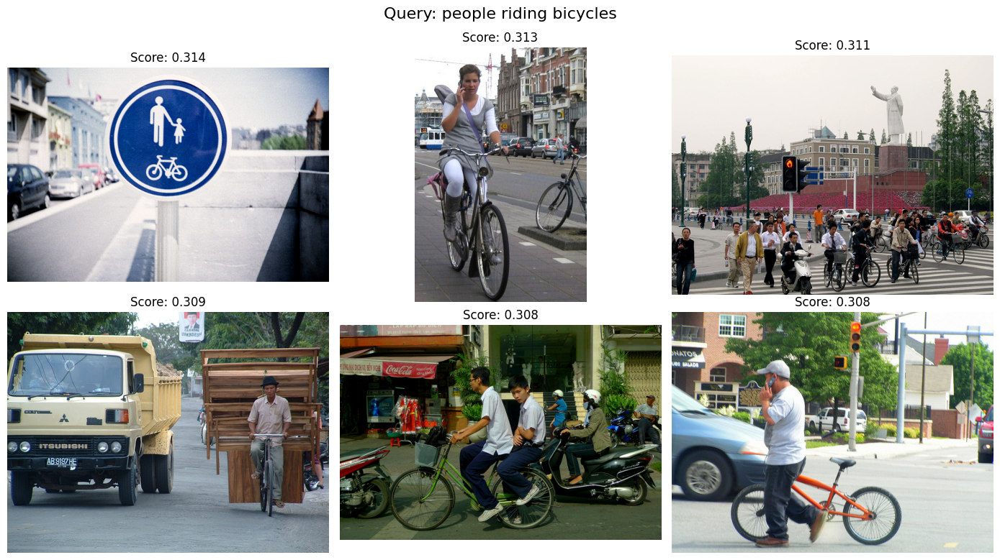

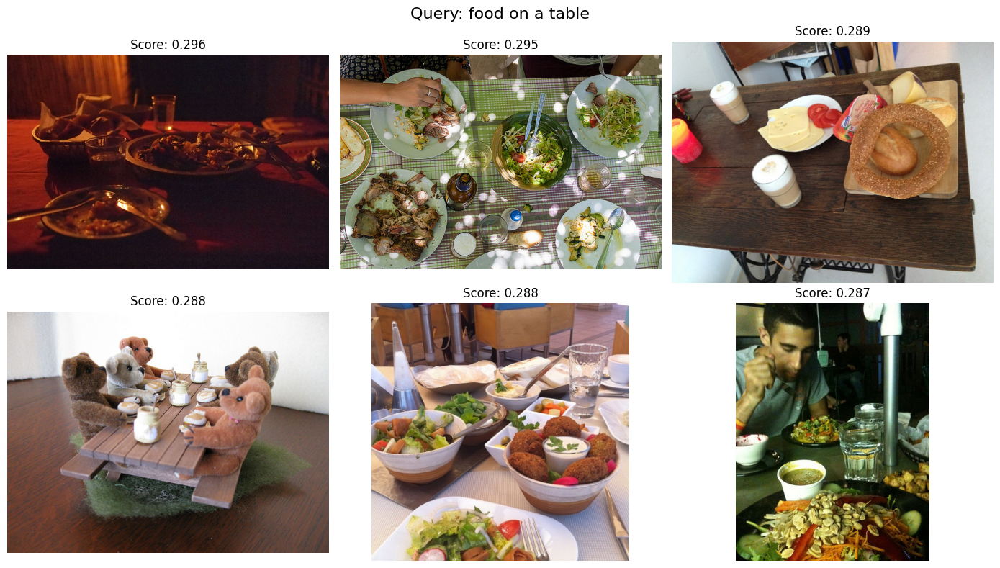

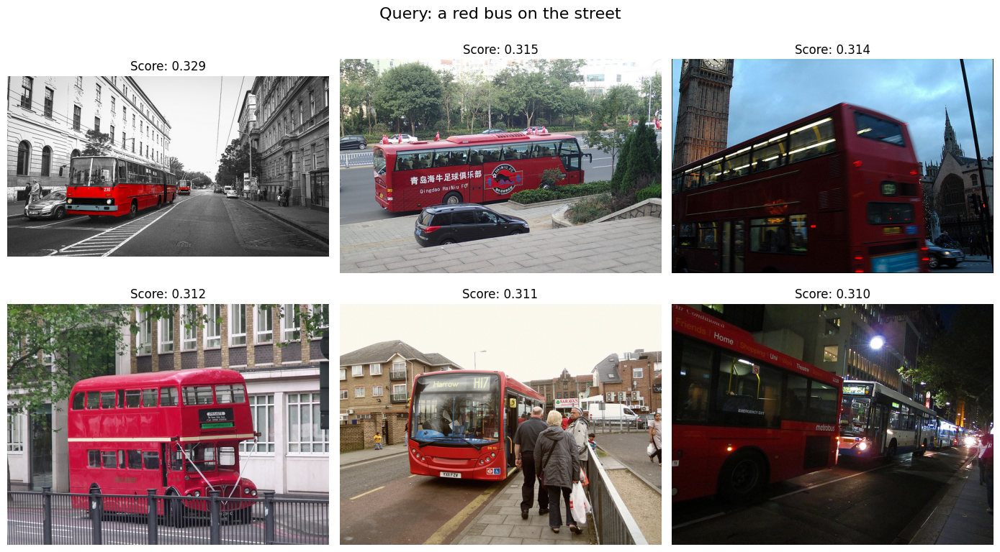

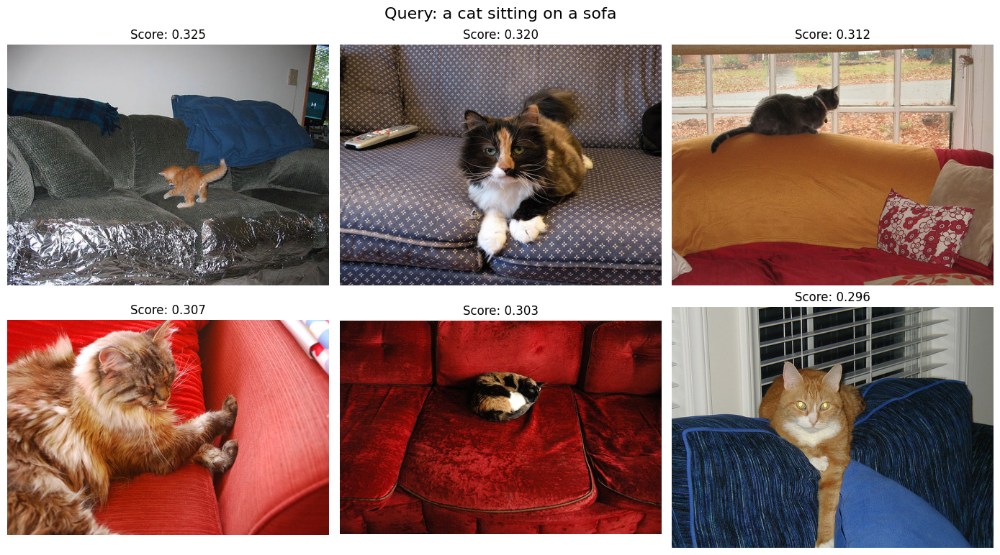

In [16]:
test_queries = [
    "a dog playing with a ball",
    "people riding bicycles",
    "food on a table",
    "a red bus on the street",
    "a cat sitting on a sofa"
]

for query in test_queries:
    results = search_images(query, top_k=6)

    plt.figure(figsize=(14, 8))

    for i, (path, score) in enumerate(results):
        img = Image.open(path).convert("RGB")
        plt.subplot(2, 3, i + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title(f"Score: {score:.3f}")

    plt.suptitle(f"Query: {query}", fontsize=16)
    plt.tight_layout()

    safe_query = query.replace(" ", "_").replace("/", "_")
    plt.savefig(os.path.join(PROJECT_DIR, f"search_{safe_query}.png"), dpi=200, bbox_inches="tight")

    plt.show()

In [17]:
test_queries = [
    "a dog playing with a ball",
    "people riding bicycles",
    "food on a table",
    "a red bus on the street",
    "a cat sitting on a sofa"
]

summary_rows = []

for query in test_queries:
    results = search_images(query, top_k=10)
    scores = [score for _, score in results]

    summary_rows.append({
        "query": query,
        "top1_score": scores[0],
        "top5_mean_score": np.mean(scores[:5]),
        "top10_mean_score": np.mean(scores[:10]),
        "min_top10_score": np.min(scores),
        "max_top10_score": np.max(scores)
    })

search_metrics_df = pd.DataFrame(summary_rows)
display(search_metrics_df)

search_metrics_df.to_csv(
    os.path.join(PROJECT_DIR, "search_metrics_summary.csv"),
    index=False
)

,query,top1_score,top5_mean_score,top10_mean_score,min_top10_score,max_top10_score
0,a dog playing with a ball,0.332237,0.323180,0.316786,0.305670,0.332237
1,people riding bicycles,0.314227,0.311058,0.308533,0.304384,0.314227
2,food on a table,0.296494,0.291366,0.288713,0.284327,0.296494
3,a red bus on the street,0.329219,0.316133,0.309770,0.299590,0.329219
4,a cat sitting on a sofa,0.324909,0.313387,0.302892,0.289609,0.324909


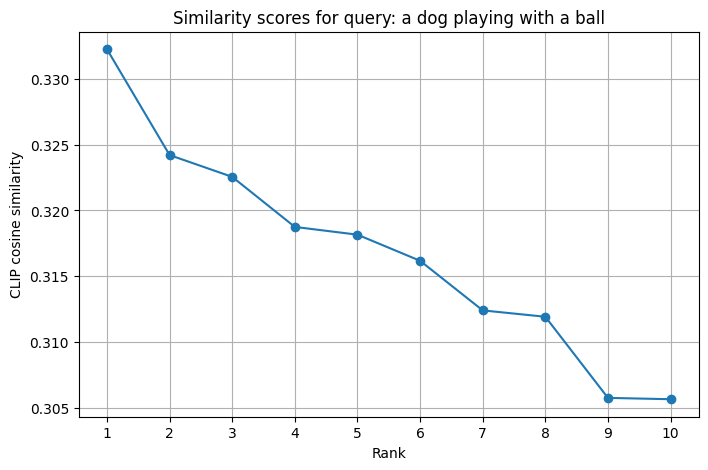

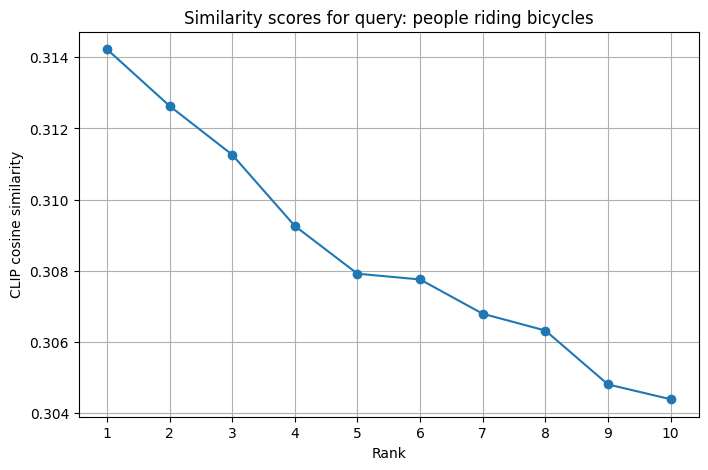

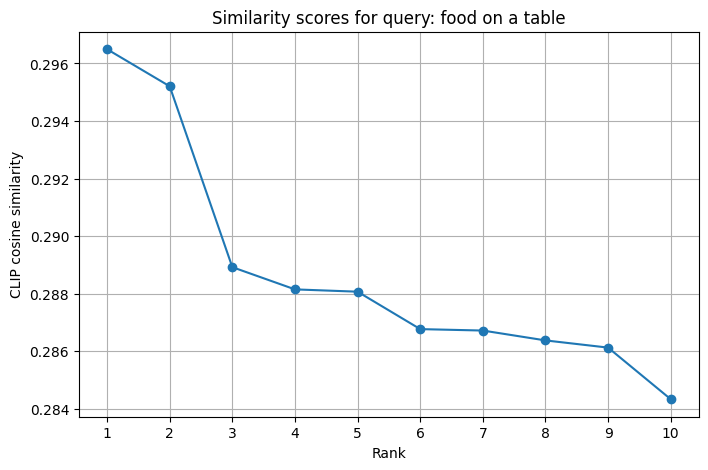

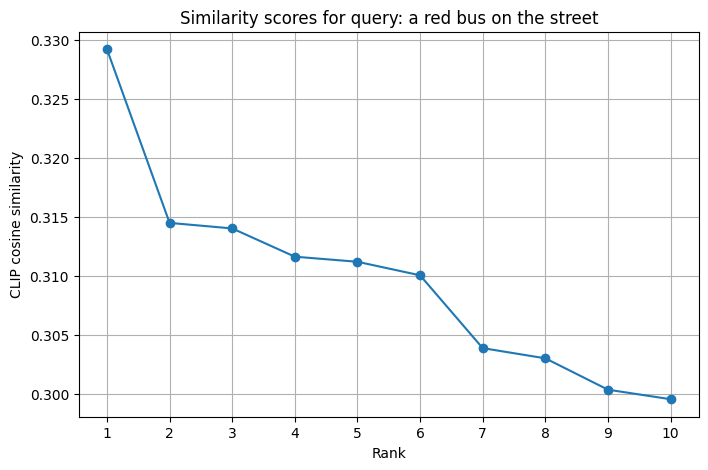

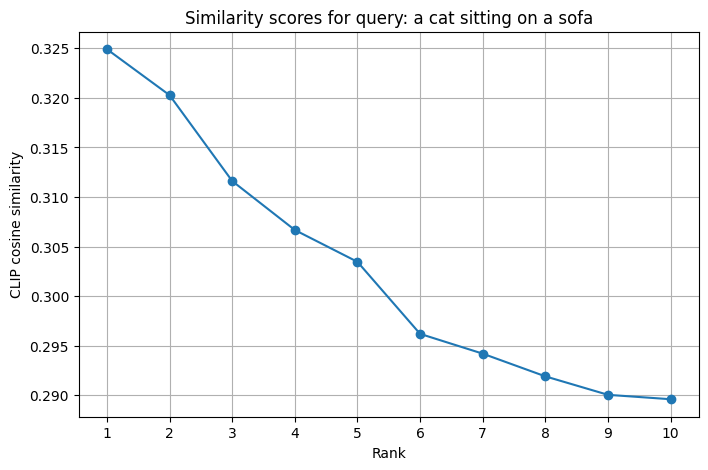

In [18]:
for query in test_queries:
    results = search_images(query, top_k=10)
    scores = [score for _, score in results]
    ranks = list(range(1, len(scores) + 1))

    plt.figure(figsize=(8, 5))
    plt.plot(ranks, scores, marker="o")
    plt.title(f"Similarity scores for query: {query}")
    plt.xlabel("Rank")
    plt.ylabel("CLIP cosine similarity")
    plt.xticks(ranks)
    plt.grid(True)

    safe_query = query.replace(" ", "_").replace("/", "_")
    plt.savefig(
        os.path.join(PROJECT_DIR, f"scores_{safe_query}.png"),
        dpi=200,
        bbox_inches="tight"
    )

    plt.show()

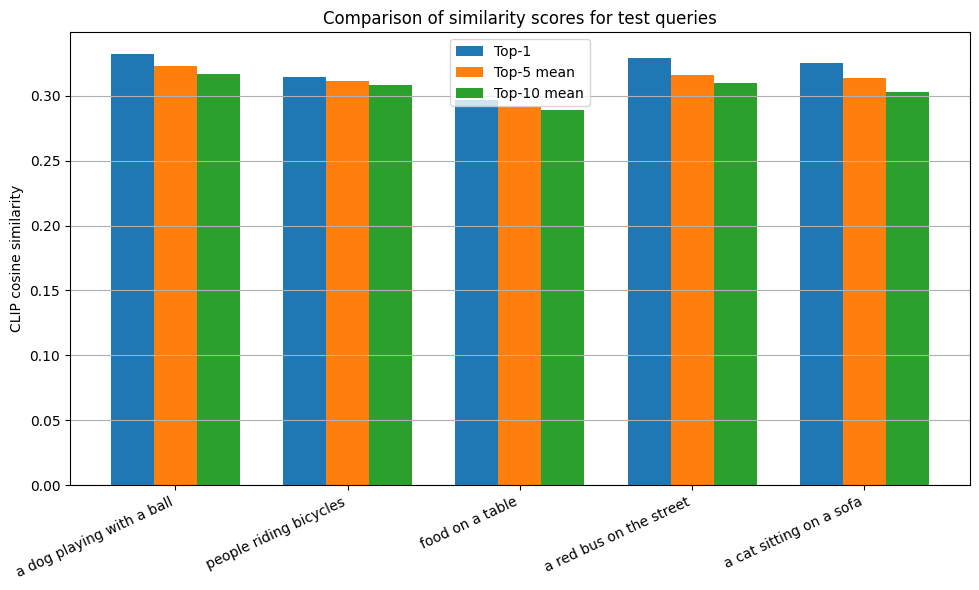

In [19]:
plt.figure(figsize=(10, 6))

x = np.arange(len(search_metrics_df))
width = 0.25

plt.bar(x - width, search_metrics_df["top1_score"], width, label="Top-1")
plt.bar(x, search_metrics_df["top5_mean_score"], width, label="Top-5 mean")
plt.bar(x + width, search_metrics_df["top10_mean_score"], width, label="Top-10 mean")

plt.xticks(x, search_metrics_df["query"], rotation=25, ha="right")
plt.ylabel("CLIP cosine similarity")
plt.title("Comparison of similarity scores for test queries")
plt.legend()
plt.grid(axis="y")
plt.tight_layout()

plt.savefig(
    os.path.join(PROJECT_DIR, "query_similarity_comparison.png"),
    dpi=200,
    bbox_inches="tight"
)

plt.show()

In [20]:
import time

timing_rows = []

for query in test_queries:
    times = []

    for _ in range(20):
        start_time = time.time()
        _ = search_images(query, top_k=10)
        end_time = time.time()
        times.append(end_time - start_time)

    timing_rows.append({
        "query": query,
        "mean_search_time_sec": np.mean(times),
        "min_search_time_sec": np.min(times),
        "max_search_time_sec": np.max(times)
    })

timing_df = pd.DataFrame(timing_rows)
display(timing_df)

timing_df.to_csv(
    os.path.join(PROJECT_DIR, "search_time_summary.csv"),
    index=False
)

,query,mean_search_time_sec,min_search_time_sec,max_search_time_sec
0,a dog playing with a ball,0.050512,0.046700,0.062783
1,people riding bicycles,0.046822,0.041896,0.054674
2,food on a table,0.048552,0.042919,0.060352
3,a red bus on the street,0.049377,0.047014,0.060722
4,a cat sitting on a sofa,0.049990,0.046558,0.061860


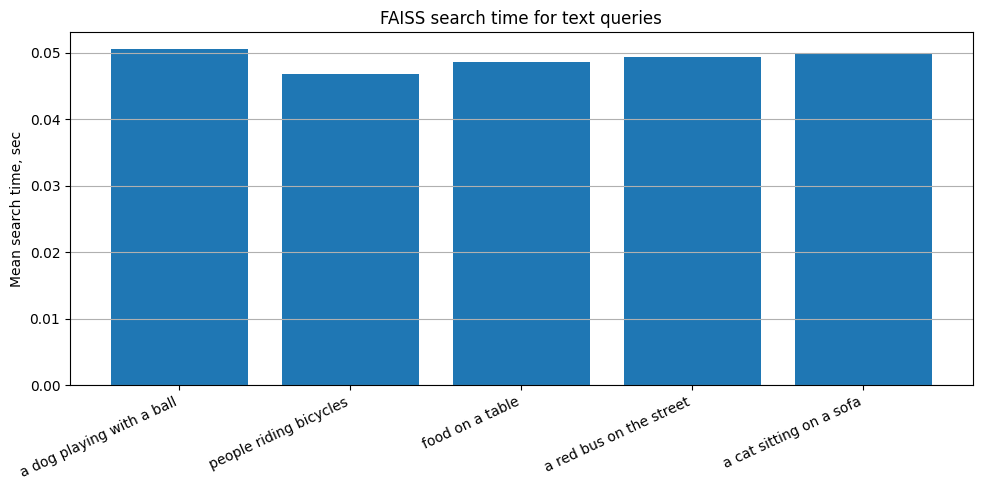

In [21]:
plt.figure(figsize=(10, 5))
plt.bar(timing_df["query"], timing_df["mean_search_time_sec"])
plt.xticks(rotation=25, ha="right")
plt.ylabel("Mean search time, sec")
plt.title("FAISS search time for text queries")
plt.grid(axis="y")
plt.tight_layout()

plt.savefig(
    os.path.join(PROJECT_DIR, "faiss_search_time.png"),
    dpi=200,
    bbox_inches="tight"
)

plt.show()

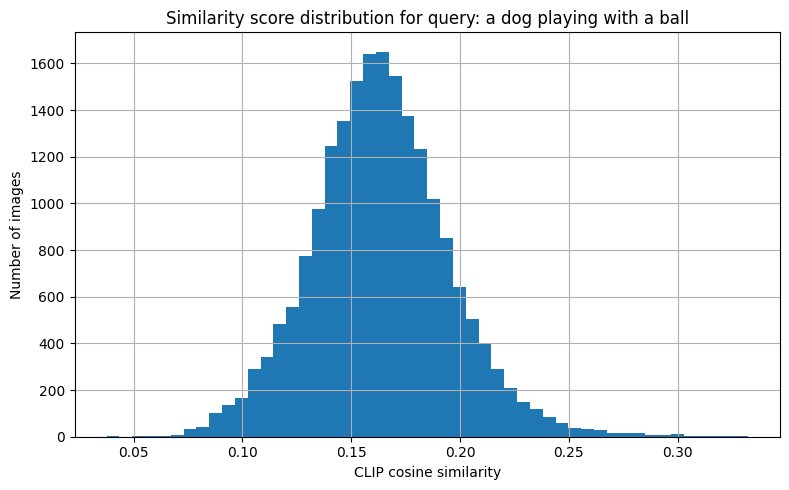

In [22]:
query = "a dog playing with a ball"

query_embedding = get_text_embedding(query)

all_scores = image_embeddings @ query_embedding.T
all_scores = all_scores.flatten()

plt.figure(figsize=(8, 5))
plt.hist(all_scores, bins=50)
plt.xlabel("CLIP cosine similarity")
plt.ylabel("Number of images")
plt.title(f"Similarity score distribution for query: {query}")
plt.grid(True)
plt.tight_layout()

plt.savefig(
    os.path.join(PROJECT_DIR, "similarity_distribution_dog_query.png"),
    dpi=200,
    bbox_inches="tight"
)

plt.show()

In [23]:
def gradio_search(query, top_k):
    results = search_images(query, top_k=int(top_k))

    output = []

    for path, score in results:
        image = Image.open(path).convert("RGB")
        caption = f"Score: {score:.3f}\n{os.path.basename(path)}"
        output.append((image, caption))

    return output

demo = gr.Interface(
    fn=gradio_search,
    inputs=[
        gr.Textbox(
            label="Text query",
            placeholder="Example: a dog playing with a ball"
        ),
        gr.Slider(
            minimum=1,
            maximum=10,
            value=5,
            step=1,
            label="Top-K"
        )
    ],
    outputs=gr.Gallery(
        label="Search results",
        columns=5,
        height="auto"
    ),
    title="CLIP Semantic Image Search",
    description="Semantic image search over COCO images using CLIP embeddings and FAISS."
)

demo.launch(share=True)


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://af5a75bc38d2da953a.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [24]:
try:
    demo.close()
except:
    pass

demo.launch(
    share=True,
    inline=False,
    debug=False,
    show_error=True
)

Closing server running on port: 7860
Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://af5a75bc38d2da953a.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [25]:
import math
import ipywidgets as widgets
from IPython.display import display, clear_output

query_box = widgets.Text(
    value="a dog playing with a ball",
    placeholder="Enter text query",
    description="Query:",
    layout=widgets.Layout(width="700px")
)

topk_slider = widgets.IntSlider(
    value=10,
    min=1,
    max=100,
    step=1,
    description="Top-K:"
)

search_button = widgets.Button(
    description="Search",
    button_style="primary"
)

output_area = widgets.Output()

def on_search_clicked(b):
    with output_area:
        clear_output(wait=True)

        query = query_box.value
        top_k = int(topk_slider.value)

        results = search_images(query, top_k=top_k)

        cols = 5
        rows = math.ceil(top_k / cols)

        plt.figure(figsize=(cols * 3, rows * 3))

        for i, (path, score) in enumerate(results):
            img = Image.open(path).convert("RGB")
            plt.subplot(rows, cols, i + 1)
            plt.imshow(img)
            plt.axis("off")
            plt.title(f"#{i+1} | {score:.3f}", fontsize=9)

        plt.suptitle(f"Query: {query}", fontsize=16)
        plt.tight_layout()
        plt.show()

search_button.on_click(on_search_clicked)

display(query_box, topk_slider, search_button, output_area)

Text(value='a dog playing with a ball', description='Query:', layout=Layout(width='700px'), placeholder='Enter…

IntSlider(value=10, description='Top-K:', min=1)

Button(button_style='primary', description='Search', style=ButtonStyle())

Output()